<h2 align='center'> Next Purchase Modeling</h2>

## Steps:

- Data Preproccessing
- Feature Engineering 
- Modeling 
- Model Fine Tuning
- Model selection

In [162]:
#import all the necessary libraries
import joblib
import hyperopt
import pandas as pd 
import numpy as np 
import seaborn as sb
import scipy.stats as st
from datetime import datetime 
from sklearn.utils import resample
import chart_studio.plotly as py
import plotly.graph_objects as go
import plotly.offline as pyoff
import matplotlib.pyplot as plt 
import plotly.express as px
import plotly.io as pio
from warnings import simplefilter
from sklearn.cluster import KMeans
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from skopt  import BayesSearchCV
from sklearn.linear_model import LogisticRegression
from scipy.stats import ( beta, expon, randint, uniform)
from sklearn.base import (TransformerMixin, BaseEstimator)
from sklearn.metrics import ( roc_curve, auc, accuracy_score, roc_auc_score,log_loss,confusion_matrix,classification_report)
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import ( FeatureUnion, Pipeline )
from sklearn.preprocessing import ( OneHotEncoder, LabelBinarizer, LabelEncoder, StandardScaler, MinMaxScaler, MaxAbsScaler )
from sklearn.model_selection import ( GridSearchCV, StratifiedKFold, train_test_split, cross_val_score, RandomizedSearchCV, KFold )
simplefilter(action='ignore', category=FutureWarning)

In [163]:
#initiate plotly
pyoff.init_notebook_mode()

In [164]:
MODELS_PATH = '../../models/'
FIGURES_PATH = '../../figures/'

### Data Preprocessing

#### Create a helper class

In [166]:

class Helper():

    def load_data(self, path):
        """ Method to load data from csv file"""
        return pd.read_csv(path)

    def check_null(self, data):
        """check for null values"""
        total = data.isnull().sum().sort_values(ascending=False)
        percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
        return pd.concat([total,percent],axis=1,keys=['Total', 'Percent']).transpose()

    def drop_nan(self, data):
        """Method that takes in a text and removes all null values."""
        return data.dropna(how='all').reset_index(drop=True)

    def drop_duplicates(self, data):
        """Method that takes in a text and removes all null values."""
        return data.drop_duplicates(keep='last').reset_index(drop=True)

    def rename_column(self, data, column_1, column_2):
        """Method that takes in a string and renames column."""
        return data.rename(columns={column_1:column_2})

    def string_to_date(self, data, column='paid_at'):
        """Method that converts date to string datetime."""
        data[column] = pd.to_datetime(data[column])
        return  data

    def previous_data(self, data,from_date, to_date, column='paid_at'):
        """Method that return purchase behaviour for last defined time period."""
        return data[(data[column] < to_date) & (data[column] >= from_date)].reset_index(drop=True)

    def next_data(self, data,column, from_date, to_date):
        """Method that returns the next data for check first purchase after the last time."""
        return data[(data[column] >= from_date) & (data[column] < to_date)].reset_index(drop=True)

    def get_customers(self, data, column='customer_id'):
        """filter unique customer who did purchase in previous 9 months."""
        customers = pd.DataFrame(data[column].unique())
        customers.columns = [column]
        return customers
    
    def get_last_purchase(self, previous_data, column='customer_id'):
        """create a dataframe with customer id and last purchase date in invoices_next."""
        last_purchase =previous_data.groupby(column).paid_at.max().reset_index()
        last_purchase.columns = [column,'max_purchase_date']
        return last_purchase

    def get_next_first_purchase(self, next_data, column='customer_id'):
        """create a dataframe with customer id and first purchase date in next"""
        next_first_purchase = next_data.groupby('customer_id').paid_at.min().reset_index()
        next_first_purchase.columns = ['customer_id','min_purchase_date']
        return next_first_purchase
        
    def join_last_first_purchases(self, last_purchase, next_first_purchase, column='customer_id'):
        """merge two dataframes [last purchase and first purchase]"""
        return pd.merge(last_purchase,next_first_purchase,on=column,how='left')

    def get_time_difference_between_purchases(self, purchases):
        """calculate the time difference in days:"""
        purchases['next_purchase_day'] = (purchases['min_purchase_date'] - purchases['max_purchase_date']).dt.days
        return purchases 

    def assign_time_difference_to_customers(self, customers, time_difference):
        """ merge time difference with customers"""
        customers_time_difference = pd.merge(customers, time_difference[['customer_id','next_purchase_day']],on='customer_id',how='left')
        return customers_time_difference




In [167]:
helper = Helper()

In [168]:
invoices = helper.load_data('../../../data/invoices.csv')
searches = helper.load_data('../../../data/searches.csv')
orders = helper.load_data('../../../data/orders.csv')
carts = helper.load_data('../../../data/carts.csv')

In [169]:
# save it a json, as we expect to use API for inferencing users
inference_data = invoices[invoices['customer_id']==6]

In [170]:
inference_data.columns

Index(['Unnamed: 0', 'id', 'customer_id', 'admin_id', 'deliverer_id',
       'returned_items', 'discount', 'refund', 'total', 'items_count',
       'destination', 'contact', 'has_discount', 'is_poked', 'receipt',
       'amount', 'total_buying_price', 'is_paid', 'transaction_id',
       'selcom_order', 'invoice_number', 'paid_at', 'is_processed',
       'is_informed', 'notification_count', 'status', 'is_received',
       'processed_at', 'tagname', 'created_at', 'updated_at'],
      dtype='object')

In [171]:
inference_data = inference_data.drop(['Unnamed: 0'], axis=1)

In [179]:
inference_data[:2].reset_index().drop('index', axis=1).to_json('../../../data/datapoint.json', orient='records')

In [174]:
inference_data[:1]

,id,customer_id,admin_id,deliverer_id,returned_items,discount,refund,total,items_count,destination,...,paid_at,is_processed,is_informed,notification_count,status,is_received,processed_at,tagname,created_at,updated_at
4,6,6,0,NaN,0,1158,0,38572,1,14 Amani St Dar es Salaam Ilala Dar es Salam T...,...,2022-05-01 07:38:06,0,0,0,Unpaid,0,0000-00-00 00:00:00,NaN,2022-05-01 10:38:06,2022-05-01 10:38:13


In [30]:
# exclude one data for inferencing , exclude user with id 6
invoices = invoices[invoices['customer_id']!=6]

In [31]:
# check invoices
invoices.head(2)

,Unnamed: 0,id,customer_id,admin_id,deliverer_id,returned_items,discount,refund,total,items_count,...,paid_at,is_processed,is_informed,notification_count,status,is_received,processed_at,tagname,created_at,updated_at
0,0,2,1,0,1.0,0,0,0,1342,1,...,2022-05-01 02:04:53,1,0,0,Paid,1,0000-00-00 00:00:00,ataiywa,2022-05-01 05:04:53,2022-12-14 22:07:24
1,1,3,1,0,2.0,0,0,0,1006,1,...,2022-05-01 05:46:26,1,0,0,Paid,0,0000-00-00 00:00:00,ataiywa,2022-05-01 05:43:25,2022-12-14 22:07:24


In [32]:
helper.check_null(invoices)

,receipt,transaction_id,deliverer_id,selcom_order,tagname,Unnamed: 0,is_paid,created_at,processed_at,is_received,...,contact,destination,items_count,total,refund,discount,returned_items,admin_id,customer_id,updated_at
Total,5836.0,5490.000000,5402.0000,3410.000000,1942.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Percent,100.0,94.071282,92.5634,58.430432,33.276217,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [33]:
invoices = helper.drop_nan(invoices)

In [34]:
helper.check_null(invoices)

,receipt,transaction_id,deliverer_id,selcom_order,tagname,Unnamed: 0,is_paid,created_at,processed_at,is_received,...,contact,destination,items_count,total,refund,discount,returned_items,admin_id,customer_id,updated_at
Total,5836.0,5490.000000,5402.0000,3410.000000,1942.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Percent,100.0,94.071282,92.5634,58.430432,33.276217,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
#convert date field from string to datetime
invoices = helper.string_to_date(invoices,'paid_at')

In [36]:
invoices.duplicated().sum()

0

In [37]:
invoices.head(2)

,Unnamed: 0,id,customer_id,admin_id,deliverer_id,returned_items,discount,refund,total,items_count,...,paid_at,is_processed,is_informed,notification_count,status,is_received,processed_at,tagname,created_at,updated_at
0,0,2,1,0,1.0,0,0,0,1342,1,...,2022-05-01 02:04:53,1,0,0,Paid,1,0000-00-00 00:00:00,ataiywa,2022-05-01 05:04:53,2022-12-14 22:07:24
1,1,3,1,0,2.0,0,0,0,1006,1,...,2022-05-01 05:46:26,1,0,0,Paid,0,0000-00-00 00:00:00,ataiywa,2022-05-01 05:43:25,2022-12-14 22:07:24


In [38]:
#choose 30 November as a cutt of date (1, Jan - 30 November) for behaviour data
invoices_previous = helper.previous_data(data = invoices, from_date = datetime(2022,1,1,00,00,00), to_date= datetime(2022,11,30,23,59,00))

In [39]:
invoices_previous.head(2)

,Unnamed: 0,id,customer_id,admin_id,deliverer_id,returned_items,discount,refund,total,items_count,...,paid_at,is_processed,is_informed,notification_count,status,is_received,processed_at,tagname,created_at,updated_at
0,0,2,1,0,1.0,0,0,0,1342,1,...,2022-05-01 02:04:53,1,0,0,Paid,1,0000-00-00 00:00:00,ataiywa,2022-05-01 05:04:53,2022-12-14 22:07:24
1,1,3,1,0,2.0,0,0,0,1006,1,...,2022-05-01 05:46:26,1,0,0,Paid,0,0000-00-00 00:00:00,ataiywa,2022-05-01 05:43:25,2022-12-14 22:07:24


In [40]:
# data after cut off date (1 month window), to check for next purchase
invoices_next = helper.previous_data(data = invoices, from_date = datetime(2022,11,30,23,59,00), to_date= datetime(2022,12,31,23,59,0))

In [41]:
invoices_next.head(2)

,Unnamed: 0,id,customer_id,admin_id,deliverer_id,returned_items,discount,refund,total,items_count,...,paid_at,is_processed,is_informed,notification_count,status,is_received,processed_at,tagname,created_at,updated_at
0,4219,4561,106,0,NaN,0,0,0,92600,5,...,2022-12-01 04:55:53,0,0,0,Unpaid,0,0000-00-00 00:00:00,francis,2022-12-01 07:55:53,2022-12-15 09:52:40
1,4220,4562,922,0,NaN,0,55,0,39610,13,...,2022-12-01 06:08:25,0,0,0,Unpaid,0,0000-00-00 00:00:00,francis,2022-12-01 09:08:25,2022-12-15 13:28:13


In [42]:
#filter unique customer who did purchase in previous 9 months
invoices_customers_previous = helper.get_customers(invoices_previous, column='customer_id')

In [43]:
invoices_customers_previous.shape

(592, 1)

In [44]:
#create a dataframe with customer id and last purchase date in invoices_previous
last_purchase = helper.get_last_purchase(invoices_previous, column='customer_id')

In [45]:
last_purchase.head()

,customer_id,max_purchase_date
0,1,2022-11-29 12:43:04
1,4,2022-10-29 10:37:10
2,5,2022-11-06 15:20:49
3,7,2022-05-09 19:22:01
4,9,2022-06-18 15:17:11


In [46]:
#create a dataframe with customer id and first purchase date in next
next_first_purchase = helper.get_next_first_purchase(invoices_next, column='customer_id')

In [47]:
next_first_purchase.head()

,customer_id,min_purchase_date
0,1,2022-12-02 07:22:07
1,14,2022-12-03 07:24:57
2,17,2022-12-02 14:39:17
3,23,2022-12-01 13:37:52
4,25,2022-12-01 19:23:20


In [48]:
#merge two dataframes [last purchase and first purchase]
purchase_dates = helper.join_last_first_purchases(last_purchase, next_first_purchase, column='customer_id' )

In [49]:

# this dateframe shows the last purchase date and the corresponding first purchase per customer 
purchase_dates

,customer_id,max_purchase_date,min_purchase_date
0,1,2022-11-29 12:43:04,2022-12-02 07:22:07
1,4,2022-10-29 10:37:10,NaT
2,5,2022-11-06 15:20:49,NaT
3,7,2022-05-09 19:22:01,NaT
4,9,2022-06-18 15:17:11,NaT
...,...,...,...
587,1685,2022-11-27 15:42:19,NaT
588,1702,2022-11-28 10:54:08,NaT
589,1704,2022-11-28 13:05:53,NaT
590,1710,2022-11-29 11:48:12,NaT


In [50]:
#calculate the time difference in days:
purchase_dates = helper.get_time_difference_between_purchases(purchases=purchase_dates)

In [51]:
purchase_dates['next_purchase_day']

0      2.0
1      NaN
2      NaN
3      NaN
4      NaN
      ... 
587    NaN
588    NaN
589    NaN
590    NaN
591    0.0
Name: next_purchase_day, Length: 592, dtype: float64

In [52]:
#merge with time differences with customers
invoices_customers = helper.assign_time_difference_to_customers(invoices_customers_previous, purchase_dates)

In [53]:
#print customers
invoices_customers.head()

,customer_id,next_purchase_day
0,1,2.0
1,10,NaN
2,12,NaN
3,17,3.0
4,19,NaN


In [54]:
#fill NA values with 999 for easy identification
invoices_customers= invoices_customers.fillna(999)

In [55]:
invoices_customers.head()

,customer_id,next_purchase_day
0,1,2.0
1,10,999.0
2,12,999.0
3,17,3.0
4,19,999.0


### Features Engineering

#### Applying Recency, Frequency, and Customer Monetary Value

#### Find recency vaules

In [56]:
#get max purchase date for Recency and create a dataframe of the last purchase before cut off date
invoices_max_purchase = invoices_previous.groupby('customer_id').paid_at.max().reset_index()
invoices_max_purchase.columns = ['customer_id','max_purchase_date']

In [57]:
invoices_max_purchase.head()

,customer_id,max_purchase_date
0,1,2022-11-29 12:43:04
1,4,2022-10-29 10:37:10
2,5,2022-11-06 15:20:49
3,7,2022-05-09 19:22:01
4,9,2022-06-18 15:17:11


In [58]:
invoices_max_purchase['max_purchase_date'].max() # the last purchase before cut off

Timestamp('2022-11-30 17:34:06')

In [59]:
#find the recency in days and add it to invoices_customers, given as the day difference between the last purchase before cut off, and other purchases before cut of
invoices_max_purchase['Recency'] = (invoices_max_purchase['max_purchase_date'].max() - invoices_max_purchase['max_purchase_date']).dt.days
invoices_customers = pd.merge(invoices_customers, invoices_max_purchase[['customer_id','Recency']], on='customer_id')

In [60]:
invoices_customers.head()

,customer_id,next_purchase_day,Recency
0,1,2.0,1
1,10,999.0,210
2,12,999.0,205
3,17,3.0,1
4,19,999.0,164


In [61]:
invoices_customers[invoices_customers['Recency']>=100][:10]

,customer_id,next_purchase_day,Recency
1,10,999.0,210
2,12,999.0,205
4,19,999.0,164
5,22,999.0,183
6,7,999.0,204
8,27,999.0,201
9,30,999.0,181
14,28,999.0,202
16,40,999.0,202
19,47,999.0,133


In [62]:
#plot recency
plot_data = [
    go.Histogram(
        x=invoices_customers['Recency']
    )
]

plot_layout = go.Layout(
        title='Recency',
        xaxis_title=" Recency (days)",
        yaxis_title="Customers (counts)",
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pio.write_image(fig, FIGURES_PATH+"recency.png")
pyoff.iplot(fig)

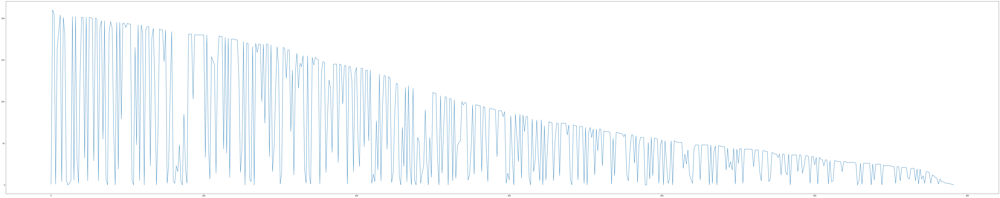

In [63]:
plt.figure(figsize=(100,20))
plt.plot(invoices_customers['Recency'])
plt.savefig(FIGURES_PATH+"elbow.png")

In [64]:
#clustering for Recency, use elbow method to determine the number of clusters
kmeans_recency = KMeans(n_clusters=5)
kmeans_recency.fit(invoices_customers[['Recency']])
invoices_customers['RecencyCluster'] = kmeans_recency.predict(invoices_customers[['Recency']])
import joblib
joblib.dump(kmeans_recency,MODELS_PATH+'kmeans_recency.joblib')

['../../models/kmeans_recency.joblib']

In [65]:
invoices_customers.head()

,customer_id,next_purchase_day,Recency,RecencyCluster
0,1,2.0,1,0
1,10,999.0,210,1
2,12,999.0,205,1
3,17,3.0,1,0
4,19,999.0,164,1


In [66]:
invoices_customers['RecencyCluster'].value_counts()

0    218
3    145
2     86
1     82
4     61
Name: RecencyCluster, dtype: int64

In [67]:
invoices_customers.groupby('RecencyCluster')['Recency'].mean()

RecencyCluster
0      9.899083
1    183.743902
2     80.732558
3     42.434483
4    136.016393
Name: Recency, dtype: float64

In [68]:
#invoices  clusters method
def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final

In [69]:
#invoices recency clusters
invoices_customers = order_cluster('RecencyCluster', 'Recency',invoices_customers,False)

#print cluster characteristics
invoices_customers.groupby('RecencyCluster')['Recency'].describe()

,count,mean,std,min,25%,50%,75%,max
RecencyCluster,,,,,,,,
0,82.0,183.743902,12.303579,162.0,175.00,181.5,194.00,210.0
1,61.0,136.016393,13.597171,110.0,128.00,140.0,145.00,159.0
2,86.0,80.732558,13.327040,62.0,69.25,78.5,91.75,107.0
3,145.0,42.434483,9.699523,27.0,34.00,43.0,50.00,61.0
4,218.0,9.899083,8.754664,0.0,2.00,7.0,17.50,26.0


#### Frequency

In [70]:
#get total purchases for frequency scores
invoices_frequency = invoices_previous.groupby('customer_id').paid_at.count().reset_index()
invoices_frequency.columns = ['customer_id','Frequency']


In [71]:
invoices_frequency[:5]

,customer_id,Frequency
0,1,98
1,4,28
2,5,24
3,7,1
4,9,8


In [72]:
#add frequency column to invoices_customers
invoices_customers = pd.merge(invoices_customers, invoices_frequency, on='customer_id')

In [73]:
invoices_customers[:10]

,customer_id,next_purchase_day,Recency,RecencyCluster,Frequency
0,1,2.0,1,4,98
1,17,3.0,1,4,15
2,23,5.0,4,4,49
3,25,7.0,6,4,118
4,31,5.0,0,4,42
5,33,3.0,2,4,114
6,35,13.0,5,4,28
7,37,17.0,6,4,10
8,46,26.0,2,4,9
9,60,6.0,5,4,25


In [74]:
invoices_customers['Frequency'].max()

148

In [75]:
#plot frequency
plot_data = [
    go.Histogram(
        x=invoices_customers['Frequency'],
    )
]

plot_layout = go.Layout(
        title='Frequency',
        xaxis_title="Frequency",
        yaxis_title="Customers (counts)"
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pio.write_image(fig,FIGURES_PATH+"frequency.png")
pyoff.iplot(fig)

In [76]:
#clustering for frequency
kmeans_frequency = KMeans(n_clusters=5)
kmeans_frequency.fit(invoices_customers[['Frequency']])
invoices_customers['FrequencyCluster'] = kmeans_frequency.predict(invoices_customers[['Frequency']])
import joblib
joblib.dump(kmeans_frequency,MODELS_PATH+'kmeans_frequency.joblib')

['../../models/kmeans_frequency.joblib']

In [77]:
#order frequency clusters and show the characteristics
invoices_customers = order_cluster('FrequencyCluster', 'Frequency',invoices_customers,True)
invoices_customers.groupby('FrequencyCluster')['Frequency'].describe()

,count,mean,std,min,25%,50%,75%,max
FrequencyCluster,,,,,,,,
0,469.0,2.027719,1.577513,1.0,1.0,1.0,3.00,7.0
1,88.0,12.977273,4.887181,8.0,9.0,11.5,15.25,25.0
2,22.0,37.681818,8.828452,27.0,29.5,38.0,42.75,54.0
3,9.0,75.888889,14.304234,59.0,65.0,71.0,86.00,98.0
4,4.0,131.500000,17.990738,114.0,117.0,132.0,146.50,148.0


#### Monetary Value

In [78]:
#calculate monetary value, create a dataframe with it
invoices_previous['Revenue'] = invoices_previous['amount'] * invoices_previous['items_count']
invoices_revenue = invoices_previous.groupby('customer_id').Revenue.sum().reset_index()

In [79]:
invoices_revenue[:3]

,customer_id,Revenue
0,1,10811160
1,4,858913
2,5,14198231


In [80]:
#add Revenue column to invoices_customers
invoices_customers = pd.merge(invoices_customers, invoices_revenue, on='customer_id')

In [81]:
invoices_customers.head()

,customer_id,next_purchase_day,Recency,RecencyCluster,Frequency,FrequencyCluster,Revenue
0,1,2.0,1,4,98,3,10811160
1,53,1.0,0,4,86,3,173574439
2,108,2.0,0,4,69,3,302181750
3,135,0.0,0,4,76,3,87705035
4,158,1.0,0,4,59,3,463561695


In [82]:
invoices_customers['Revenue'].mean()

30873039.467905406

In [83]:
#plot Revenue
plot_data = [
    go.Histogram(
        x=invoices_customers.query('Revenue < 10000000')['Revenue']
    )
]

plot_layout = go.Layout(
        title='Monetary Value',
        xaxis_title="Revenue Value",
        yaxis_title="Customers (counts)"
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pio.write_image(fig,FIGURES_PATH+"monetary_value.png")
pyoff.iplot(fig)

In [84]:
#Revenue clusters 
kmeans_revenue = KMeans(n_clusters=5)
kmeans_revenue.fit(invoices_customers[['Revenue']])
invoices_customers['RevenueCluster'] = kmeans_revenue.predict(invoices_customers[['Revenue']])
import joblib
joblib.dump(kmeans_revenue,MODELS_PATH+'kmeans_revenue.joblib')

['../../models/kmeans_revenue.joblib']

In [85]:
#ordering clusters and who the characteristics
invoices_customers = order_cluster('RevenueCluster', 'Revenue',invoices_customers,True)
invoices_customers.groupby('RevenueCluster')['Revenue'].describe()

,count,mean,std,min,25%,50%,75%,max
RevenueCluster,,,,,,,,
0,546.0,5.753312e+06,1.135939e+07,1.211000e+03,1.149420e+05,4.662815e+05,4.798657e+06,6.123795e+07
1,31.0,1.197014e+08,3.720852e+07,6.666664e+07,9.064555e+07,1.143120e+08,1.448746e+08,1.969261e+08
2,9.0,3.074237e+08,5.771905e+07,2.286410e+08,2.754776e+08,2.984686e+08,3.268571e+08,4.056721e+08
3,4.0,6.006272e+08,1.493115e+08,4.635617e+08,5.306553e+08,5.630164e+08,6.329882e+08,8.129142e+08
4,2.0,3.127733e+09,3.668305e+08,2.868344e+09,2.998039e+09,3.127733e+09,3.257427e+09,3.387121e+09


In [86]:
#building overall segmentation
invoices_customers['OverallScore'] = invoices_customers['RecencyCluster'] + invoices_customers['FrequencyCluster'] + invoices_customers['RevenueCluster']

In [87]:
invoices_customers[:10]

,customer_id,next_purchase_day,Recency,RecencyCluster,Frequency,FrequencyCluster,Revenue,RevenueCluster,OverallScore
0,1,2.0,1,4,98,3,10811160,0,7
1,202,2.0,2,4,63,3,29233857,0,7
2,130,0.0,0,4,65,3,27193149,0,7
3,37,17.0,6,4,10,1,6088007,0,5
4,60,6.0,5,4,25,1,28373798,0,5
5,92,12.0,7,4,13,1,1629861,0,5
6,45,999.0,19,4,9,1,10545255,0,5
7,5,999.0,24,4,24,1,14198231,0,5
8,55,25.0,23,4,11,1,10093811,0,5
9,68,43.0,16,4,15,1,4078433,0,5


In [88]:
#assign segment names
invoices_customers['Segment'] = 'Low-Value'
invoices_customers.loc[invoices_customers['OverallScore']>2,'Segment'] = 'Mid-Value' 
invoices_customers.loc[invoices_customers['OverallScore']>4,'Segment'] = 'High-Value' 

In [89]:
invoices_customers['Segment'].value_counts()

Mid-Value     256
Low-Value     222
High-Value    114
Name: Segment, dtype: int64

In [90]:
invoices_customers[:5]

,customer_id,next_purchase_day,Recency,RecencyCluster,Frequency,FrequencyCluster,Revenue,RevenueCluster,OverallScore,Segment
0,1,2.0,1,4,98,3,10811160,0,7,High-Value
1,202,2.0,2,4,63,3,29233857,0,7,High-Value
2,130,0.0,0,4,65,3,27193149,0,7,High-Value
3,37,17.0,6,4,10,1,6088007,0,5,High-Value
4,60,6.0,5,4,25,1,28373798,0,5,High-Value


In [91]:
#plot revenue vs frequency
invoices_graph = invoices_customers.query("Revenue < 50000000 and Frequency < 100")
plot_data = [
    go.Scatter(
        x=invoices_graph.query("Segment == 'Low-Value'")['Frequency'],
        y=invoices_graph.query("Segment == 'Low-Value'")['Revenue'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=invoices_graph.query("Segment == 'Mid-Value'")['Frequency'],
        y=invoices_graph.query("Segment == 'Mid-Value'")['Revenue'],
        mode='markers',
        name='Mid',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=invoices_graph.query("Segment == 'High-Value'")['Frequency'],
        y=invoices_graph.query("Segment == 'High-Value'")['Revenue'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "Revenue"},
        xaxis= {'title': "Frequency"},
        title='Segments'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
fig.write_image(FIGURES_PATH+"frequency_revenue.png")
pyoff.iplot(fig)

In [92]:
#plot revenue vs recency
invoices_graph = invoices_customers.query("Revenue < 50000000 and Frequency < 100")

plot_data = [
    go.Scatter(
        x=invoices_graph.query("Segment == 'Low-Value'")['Recency'],
        y=invoices_graph.query("Segment == 'Low-Value'")['Revenue'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=invoices_graph.query("Segment == 'Mid-Value'")['Recency'],
        y=invoices_graph.query("Segment == 'Mid-Value'")['Revenue'],
        mode='markers',
        name='Mid',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=invoices_graph.query("Segment == 'High-Value'")['Recency'],
        y=invoices_graph.query("Segment == 'High-Value'")['Revenue'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "Revenue"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
fig.write_image(FIGURES_PATH+"recency_revenue.png")
pyoff.iplot(fig)

In [93]:

#plot frequency vs recency
invoices_graph = invoices_customers.query("Revenue < 50000000 and Frequency < 100")

plot_data = [
    go.Scatter(
        x=invoices_graph.query("Segment == 'Low-Value'")['Recency'],
        y=invoices_graph.query("Segment == 'Low-Value'")['Frequency'],
        mode='markers',
        name='Low',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        go.Scatter(
        x=invoices_graph.query("Segment == 'Mid-Value'")['Recency'],
        y=invoices_graph.query("Segment == 'Mid-Value'")['Frequency'],
        mode='markers',
        name='Mid',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        go.Scatter(
        x=invoices_graph.query("Segment == 'High-Value'")['Recency'],
        y=invoices_graph.query("Segment == 'High-Value'")['Frequency'],
        mode='markers',
        name='High',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
]

plot_layout = go.Layout(
        yaxis= {'title': "Frequency"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
fig.write_image(FIGURES_PATH+"freuency_recency.png")
pyoff.iplot(fig)

#### Analyse the last three purchases

In [94]:
#create a dataframe with customer_id and Invoice Date
invoices_day_order = invoices_previous[['customer_id','paid_at']]

In [95]:
#convert Invoice Datetime to day
invoices_day_order['InvoiceDay'] = invoices_previous['paid_at'].dt.date
invoices_day_order = invoices_day_order.sort_values(['customer_id','paid_at'])

/tmp/ipykernel_11725/566506520.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [96]:
invoices_day_order[:10]

,customer_id,paid_at,InvoiceDay
0,1,2022-05-01 02:04:53,2022-05-01
131,1,2022-05-01 02:04:53,2022-05-01
2,1,2022-05-01 02:48:24,2022-05-01
1,1,2022-05-01 05:46:26,2022-05-01
3,1,2022-05-01 06:02:28,2022-05-01
4,1,2022-05-03 16:54:03,2022-05-03
5,1,2022-05-03 17:20:54,2022-05-03
8,1,2022-05-05 21:59:03,2022-05-05
24,1,2022-05-10 21:23:28,2022-05-10
43,1,2022-05-12 16:03:08,2022-05-12


In [97]:
#drop duplicates
invoices_day_order = invoices_day_order.drop_duplicates(subset=['customer_id','InvoiceDay'],keep='first')

In [98]:
invoices_day_order[:10]

,customer_id,paid_at,InvoiceDay
0,1,2022-05-01 02:04:53,2022-05-01
4,1,2022-05-03 16:54:03,2022-05-03
8,1,2022-05-05 21:59:03,2022-05-05
24,1,2022-05-10 21:23:28,2022-05-10
43,1,2022-05-12 16:03:08,2022-05-12
65,1,2022-05-13 00:43:22,2022-05-13
182,1,2022-05-25 22:07:13,2022-05-25
206,1,2022-05-30 02:26:59,2022-05-30
236,1,2022-05-31 19:09:05,2022-05-31
238,1,2022-06-01 04:17:30,2022-06-01


In [99]:
#shifting last 3 purchase dates
invoices_day_order['PrevInvoiceDate'] = invoices_day_order.groupby('customer_id')['InvoiceDay'].shift(1)
invoices_day_order['T2InvoiceDate'] = invoices_day_order.groupby('customer_id')['InvoiceDay'].shift(2)
invoices_day_order['T3InvoiceDate'] = invoices_day_order.groupby('customer_id')['InvoiceDay'].shift(3)

In [100]:
invoices_day_order[:10]

,customer_id,paid_at,InvoiceDay,PrevInvoiceDate,T2InvoiceDate,T3InvoiceDate
0,1,2022-05-01 02:04:53,2022-05-01,NaN,NaN,NaN
4,1,2022-05-03 16:54:03,2022-05-03,2022-05-01,NaN,NaN
8,1,2022-05-05 21:59:03,2022-05-05,2022-05-03,2022-05-01,NaN
24,1,2022-05-10 21:23:28,2022-05-10,2022-05-05,2022-05-03,2022-05-01
43,1,2022-05-12 16:03:08,2022-05-12,2022-05-10,2022-05-05,2022-05-03
65,1,2022-05-13 00:43:22,2022-05-13,2022-05-12,2022-05-10,2022-05-05
182,1,2022-05-25 22:07:13,2022-05-25,2022-05-13,2022-05-12,2022-05-10
206,1,2022-05-30 02:26:59,2022-05-30,2022-05-25,2022-05-13,2022-05-12
236,1,2022-05-31 19:09:05,2022-05-31,2022-05-30,2022-05-25,2022-05-13
238,1,2022-06-01 04:17:30,2022-06-01,2022-05-31,2022-05-30,2022-05-25


In [101]:
#calculate the day differences between purchases (the 3 purchases gaps)
invoices_day_order['DayDiff'] = (invoices_day_order['InvoiceDay'] - invoices_day_order['PrevInvoiceDate']).dt.days
invoices_day_order['DayDiff2'] = (invoices_day_order['InvoiceDay'] - invoices_day_order['T2InvoiceDate']).dt.days
invoices_day_order['DayDiff3'] = (invoices_day_order['InvoiceDay'] - invoices_day_order['T3InvoiceDate']).dt.days

In [102]:
invoices_day_order[:10]

,customer_id,paid_at,InvoiceDay,PrevInvoiceDate,T2InvoiceDate,T3InvoiceDate,DayDiff,DayDiff2,DayDiff3
0,1,2022-05-01 02:04:53,2022-05-01,NaN,NaN,NaN,NaN,NaN,NaN
4,1,2022-05-03 16:54:03,2022-05-03,2022-05-01,NaN,NaN,2.0,NaN,NaN
8,1,2022-05-05 21:59:03,2022-05-05,2022-05-03,2022-05-01,NaN,2.0,4.0,NaN
24,1,2022-05-10 21:23:28,2022-05-10,2022-05-05,2022-05-03,2022-05-01,5.0,7.0,9.0
43,1,2022-05-12 16:03:08,2022-05-12,2022-05-10,2022-05-05,2022-05-03,2.0,7.0,9.0
65,1,2022-05-13 00:43:22,2022-05-13,2022-05-12,2022-05-10,2022-05-05,1.0,3.0,8.0
182,1,2022-05-25 22:07:13,2022-05-25,2022-05-13,2022-05-12,2022-05-10,12.0,13.0,15.0
206,1,2022-05-30 02:26:59,2022-05-30,2022-05-25,2022-05-13,2022-05-12,5.0,17.0,18.0
236,1,2022-05-31 19:09:05,2022-05-31,2022-05-30,2022-05-25,2022-05-13,1.0,6.0,18.0
238,1,2022-06-01 04:17:30,2022-06-01,2022-05-31,2022-05-30,2022-05-25,1.0,2.0,7.0


In [103]:
#find the mean day difference , and std 
invoices_day_diff = invoices_day_order.groupby('customer_id').agg({'DayDiff': ['mean','std']}).reset_index()
invoices_day_diff.columns = ['customer_id', 'DayDiffMean','DayDiffStd']

In [104]:
invoices_day_diff[:10]

,customer_id,DayDiffMean,DayDiffStd
0,1,5.170732,6.674213
1,4,14.083333,23.286587
2,5,10.666667,8.837151
3,7,NaN,NaN
4,9,5.600000,5.128353
5,10,NaN,NaN
6,12,4.000000,NaN
7,13,NaN,NaN
8,14,18.857143,19.445896
9,17,14.642857,32.906878


In [105]:
invoices_day_order['customer_id'].value_counts()

106     117
25       79
33       78
135      73
231      71
       ... 
727       1
719       1
705       1
693       1
1720      1
Name: customer_id, Length: 592, dtype: int64

In [106]:
##we have customers who purchased only one time, We can't keep customer who has purchased one time, for this case we keep customer who has purchased atleast 3 times
invoices_day_order_last = invoices_day_order.drop_duplicates(subset=['customer_id'],keep='last') # filter with one purchase

In [107]:
invoices_day_order_last['customer_id'].value_counts()

1       1
1064    1
1072    1
1073    1
1081    1
       ..
457     1
463     1
468     1
471     1
1720    1
Name: customer_id, Length: 592, dtype: int64

In [108]:
invoices_day_order_last = invoices_day_order_last.dropna()
invoices_day_order_last = pd.merge(invoices_day_order_last, invoices_day_diff, on='customer_id')
invoices_customers = pd.merge(invoices_customers, invoices_day_order_last[['customer_id','DayDiff','DayDiff2','DayDiff3','DayDiffMean','DayDiffStd']], on='customer_id')

In [109]:
#create invoices_class as a copy of invoices_customers before applying get_dummies
invoices_class = invoices_customers.copy()
invoices_class = pd.get_dummies(invoices_class)

In [110]:
invoices_customers[:5]

,customer_id,next_purchase_day,Recency,RecencyCluster,Frequency,FrequencyCluster,Revenue,RevenueCluster,OverallScore,Segment,DayDiff,DayDiff2,DayDiff3,DayDiffMean,DayDiffStd
0,1,2.0,1,4,98,3,10811160,0,7,High-Value,9.0,10.0,22.0,5.170732,6.674213
1,202,2.0,2,4,63,3,29233857,0,7,High-Value,4.0,7.0,12.0,4.066667,5.816903
2,130,0.0,0,4,65,3,27193149,0,7,High-Value,1.0,4.0,5.0,1.981132,2.170524
3,37,17.0,6,4,10,1,6088007,0,5,High-Value,18.0,44.0,67.0,21.777778,7.479602
4,60,6.0,5,4,25,1,28373798,0,5,High-Value,2.0,4.0,7.0,10.315789,6.515389


### Modeling

In [111]:
invoices_class.next_purchase_day

0        2.0
1        2.0
2        0.0
3       17.0
4        6.0
       ...  
173      1.0
174     24.0
175     11.0
176    999.0
177      0.0
Name: next_purchase_day, Length: 178, dtype: float64

In [112]:
invoices_class['next_purchase_day_range'] = 1
invoices_class.loc[invoices_class.next_purchase_day>30,'next_purchase_day_range'] = 0

In [113]:
invoices_class.columns

Index(['customer_id', 'next_purchase_day', 'Recency', 'RecencyCluster',
       'Frequency', 'FrequencyCluster', 'Revenue', 'RevenueCluster',
       'OverallScore', 'DayDiff', 'DayDiff2', 'DayDiff3', 'DayDiffMean',
       'DayDiffStd', 'Segment_High-Value', 'Segment_Low-Value',
       'Segment_Mid-Value', 'next_purchase_day_range'],
      dtype='object')

In [114]:
corr_matrix = invoices_class.corr()

In [115]:
corr_matrix['next_purchase_day_range'].sort_values(ascending=False)

next_purchase_day_range    1.000000
Segment_High-Value         0.606291
RecencyCluster             0.592503
OverallScore               0.581750
FrequencyCluster           0.427907
Frequency                  0.350838
RevenueCluster             0.188219
Revenue                    0.135342
customer_id                0.078861
DayDiffStd                -0.167513
DayDiffMean               -0.247768
DayDiff                   -0.279249
DayDiff3                  -0.336135
DayDiff2                  -0.343140
Segment_Low-Value         -0.371607
Segment_Mid-Value         -0.423608
Recency                   -0.638084
next_purchase_day         -0.833143
Name: next_purchase_day_range, dtype: float64

In [116]:
# drop less importand columns
invoices_class = invoices_class.drop(['next_purchase_day','Segment_Mid-Value', 'DayDiff', 'DayDiff3', 'DayDiff2', 'Segment_Low-Value', 'Recency', 'DayDiffMean','DayDiffStd'], axis=1)

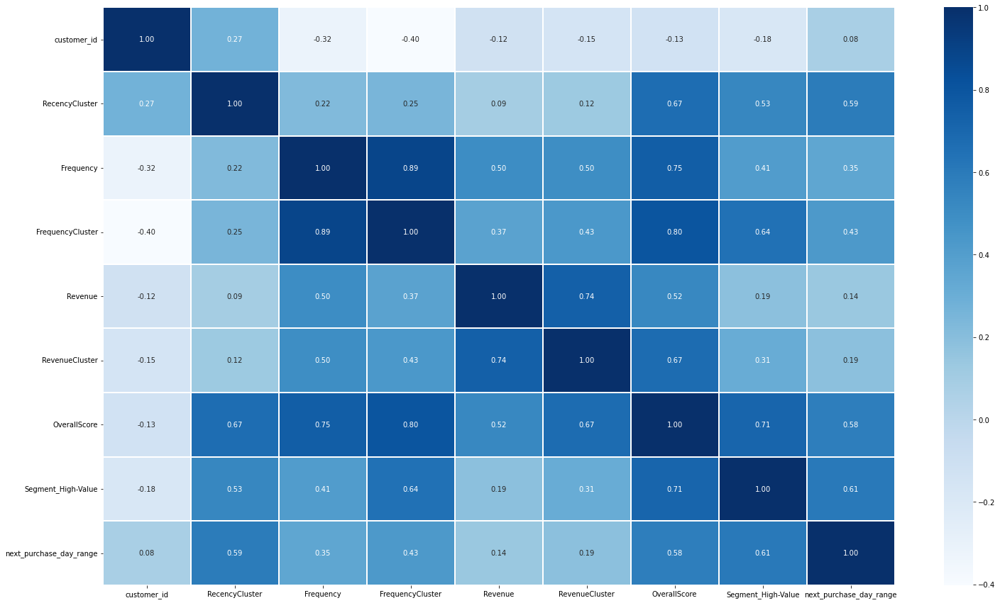

In [117]:
corr = invoices_class[invoices_class.columns].corr()
plt.figure(figsize = (25,15))
sb.heatmap(corr, annot = True, linewidths=0.2, fmt=".2f", cmap='Blues')
plt.savefig(FIGURES_PATH+"heatmap_features.png")

In [118]:
invoices_class['next_purchase_day_range'].value_counts()

1    110
0     68
Name: next_purchase_day_range, dtype: int64

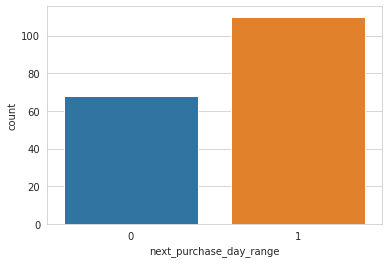

In [119]:
sb.set_style('whitegrid')
_=sb.countplot(invoices_class, x='next_purchase_day_range')
plt.savefig(FIGURES_PATH+"class_imbalance.png")

In [120]:
#Handling class imbalance due to outlier removal
class HandleImbalance(BaseEstimator,TransformerMixin):
    def __init__(self,target):
        self.target = target
    def fit(self,X,y=None):
        return self
    def transform(self,X,y=None):
        #Handling data imbalance
        # separate minority and majority classes
        not_purchase = X[X[self.target]==0]
        purchase = X[X[self.target]==1]

        # upsample minority
        not_purchase_upsampled = resample(not_purchase,
                                  replace=True, # sample with replacement
                                  n_samples=len(purchase), # match number in majority class
                                  random_state=27) # reproducible results

        # combine majority and upsampled minority
        upsampled = pd.concat([purchase, not_purchase_upsampled])
        return upsampled

In [121]:
handle_imbalance = HandleImbalance(target='next_purchase_day_range')

In [122]:
handle_imbalance.fit(invoices_class)
invoices_class = handle_imbalance.transform(invoices_class)

In [123]:
# check new class counts
invoices_class.next_purchase_day_range.value_counts()

1    110
0    110
Name: next_purchase_day_range, dtype: int64

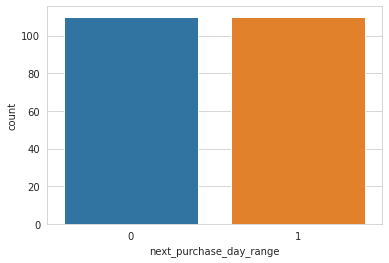

In [124]:
sb.set_style('whitegrid')
_=sb.countplot(invoices_class, x='next_purchase_day_range')
plt.savefig(FIGURES_PATH+"balanced_classes.png")

In [125]:
#train & test split
X, y = invoices_class.drop('next_purchase_day_range',axis=1), invoices_class.next_purchase_day_range

In [126]:
#create a class for numerical data tansformation
class Transform(TransformerMixin,BaseEstimator):
    def fit(self,X,y=None):
        return self
    def transform(self,X,y=0):
        num_pipeline = Pipeline([('scaler',StandardScaler())])
        X = num_pipeline.fit_transform(X)
        return pd.DataFrame(X)

In [127]:
transform =  Transform()

In [128]:
X = transform.fit_transform(X)

In [129]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=24, shuffle=True)
X_valid, X_test, y_valid, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=24, shuffle=True)

In [130]:
X_train.head()

,0,1,2,3,4,5,6,7
190,-1.384301,-3.703499,-0.424412,0.118033,-0.278372,-0.434348,-2.052619,-1.147079
66,0.624697,0.545626,-0.512873,-1.010975,-0.305906,-0.434348,-0.378047,-1.147079
83,-0.658708,0.545626,-0.380181,0.118033,0.319041,1.035753,0.738334,0.871780
30,0.768508,0.545626,-0.203259,0.118033,-0.026640,-0.434348,0.180143,0.871780
109,-1.172942,0.545626,5.767860,3.505054,12.942169,5.446056,4.087477,0.871780


In [131]:
X_train.shape

(132, 8)

In [132]:
X_valid.head()

,0,1,2,3,4,5,6,7
193,1.570364,0.545626,-0.557103,-1.010975,2.245389,3.975955,1.296524,0.871780
69,1.574721,0.545626,-0.468642,-1.010975,-0.179277,-0.434348,-0.378047,-1.147079
121,0.539717,-0.516655,-0.601334,-1.010975,-0.252081,-0.434348,-0.936238,-1.147079
16,-0.063853,0.545626,-0.380181,0.118033,-0.198058,-0.434348,0.180143,0.871780
78,-1.288426,0.545626,3.025568,2.376047,0.492354,1.035753,1.854715,0.871780


In [133]:
y.unique()

array([1, 0])

In [134]:
y_train.unique()

array([0, 1])

In [135]:
class ModelsTraining(TransformerMixin,BaseEstimator):
    def __init__(self):
         self.random_state  = 123
         self.n_estimators  = 120
         self.learning_rate = 0.001
         self.max_depth     = 5
    def fit(self,X,y):
        return self
    def transform(self,X,y):
        #algorithms to work with ---- model training
        lrc = LogisticRegression(penalty='l1', solver='liblinear', max_iter=10000)
        rfc = RandomForestClassifier(n_estimators=self.n_estimators, random_state=self.random_state)
        lgbm = LGBMClassifier()
        cat = CatBoostClassifier()
        models = [lrc,rfc,cat,lgbm]
        model_names = ['lrc','rfc','cat','lgbm']
        accuracy_scores = []
        roc_auc_scores = []
        names = []
        for model,model_name in zip(models,model_names):
            model.fit(X,np.ravel(y))  
            accuracy_score = cross_val_score(model,X,np.ravel(y),cv=5,scoring='accuracy')
            roc_auc_score = cross_val_score(model,X,np.ravel(y),cv=5,scoring='roc_auc')
            roc_auc_scores.append((roc_auc_score.mean())*100)
            names.append(model_name)
            accuracy_scores.append((accuracy_score.mean())*100)
            import joblib
            joblib.dump(model,MODELS_PATH+model_name+'.joblib')
        result_accuracy_scores = pd.Series(data=[i for i in accuracy_scores],index=model_names)
        result_roc_auc_scores = pd.Series(data=[i for i in  roc_auc_scores],index=model_names)
        result_df = pd.DataFrame()
        return result_df.append(result_accuracy_scores,ignore_index=True),result_df.append(result_roc_auc_scores,ignore_index=True)

In [136]:
models = ModelsTraining()
models.fit(X=X_train, y=y_train,)
accuracy_scores, roc_auc_scores = models.transform(X=X_train,y=y_train)

Learning rate set to 0.004339
0:	learn: 0.6892070	total: 62.7ms	remaining: 1m 2s
1:	learn: 0.6854771	total: 66.4ms	remaining: 33.1s
2:	learn: 0.6813295	total: 69.1ms	remaining: 23s
3:	learn: 0.6773069	total: 70.4ms	remaining: 17.5s
4:	learn: 0.6731901	total: 71.5ms	remaining: 14.2s
5:	learn: 0.6693829	total: 72.8ms	remaining: 12.1s
6:	learn: 0.6651677	total: 73.7ms	remaining: 10.5s
7:	learn: 0.6619312	total: 74.5ms	remaining: 9.23s
8:	learn: 0.6589742	total: 75.4ms	remaining: 8.31s
9:	learn: 0.6555954	total: 76.8ms	remaining: 7.6s
10:	learn: 0.6517514	total: 77.7ms	remaining: 6.99s
11:	learn: 0.6479926	total: 79.8ms	remaining: 6.57s
12:	learn: 0.6439373	total: 81.2ms	remaining: 6.17s
13:	learn: 0.6409102	total: 82.2ms	remaining: 5.79s
14:	learn: 0.6375287	total: 83.2ms	remaining: 5.46s
15:	learn: 0.6338181	total: 84.2ms	remaining: 5.18s
16:	learn: 0.6301638	total: 86.9ms	remaining: 5.02s
17:	learn: 0.6272030	total: 87.9ms	remaining: 4.8s
18:	learn: 0.6237451	total: 88.9ms	remaining: 4.

In [137]:
#accuracy score
accuracy_scores

,lrc,rfc,cat,lgbm
0,80.37037,84.871795,84.102564,82.507123


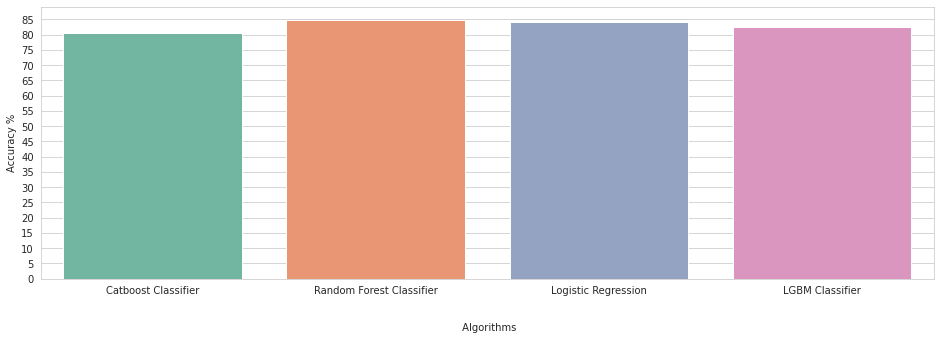

In [138]:
sb.set_style("whitegrid")
plt.figure(figsize=(16,5))
plt.yticks(np.arange(0,101,5))
plt.ylabel("Accuracy %")
plt.xlabel("\n\n Algorithms")
sb.barplot(x=['Catboost Classifier','Random Forest Classifier','Logistic Regression','LGBM Classifier'], y=list(accuracy_scores.iloc[0]), palette='Set2')
plt.savefig(FIGURES_PATH+"train_accuracies.png")
plt.show()

In [139]:
# roc auc scores
roc_auc_scores

,lrc,rfc,cat,lgbm
0,93.659452,93.180375,93.52886,90.409812


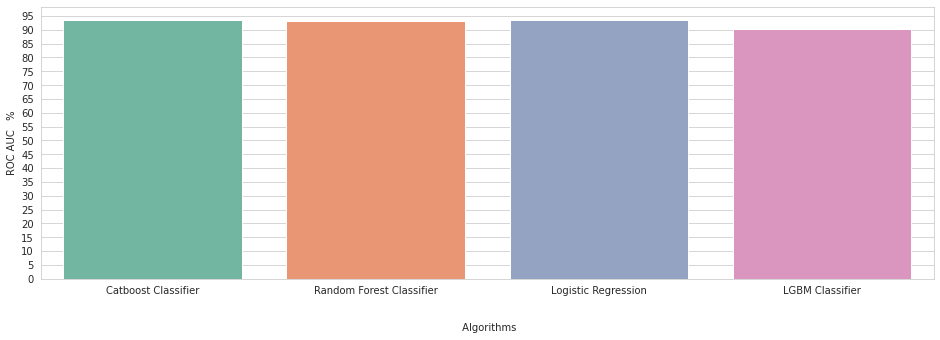

In [140]:
sb.set_style("whitegrid")
plt.figure(figsize=(16,5))
plt.yticks(np.arange(0,101,5))
plt.ylabel("ROC AUC   %")
plt.xlabel("\n\n Algorithms")
sb.barplot(x=['Catboost Classifier','Random Forest Classifier','Logistic Regression','LGBM Classifier'], y=list(roc_auc_scores.iloc[0]), palette='Set2')
plt.savefig(FIGURES_PATH+"train_roc_auc.png")
plt.show()

#### Hyperparameter Optimization

In [141]:
# Perform models optimization
class ModelsOptimization(TransformerMixin,BaseEstimator):
    def __init__(self,search_algorithm):
        self.search_algorithm = search_algorithm
    def fit(self,X,y,X_valid,y_valid):
        return self
    def transform(self,X,y,X_valid,y_valid):
        
        #Fine tune catboost, initialize parameters
        params_cat = {
            'depth':[3,1,2,6,4,5,7,8,9,10],
          'iterations':[150,100,200,300],
          'learning_rate':[0.03,0.001,0.01,0.1,0.2], 
          'l2_leaf_reg':[3,1,5,10,50],
          'border_count':[32,5,10,20,50,80,100]
        }
        
        #initialize parameters
        params_lgbm = {
            'learning_rate' : [0.05, 0.01, 0.15, 0.20],
            'max_depth':  [ 3, 4, 5, 6, 8, 10, 12, 15],
            'boosting_type' : ['gbdt', 'dart', 'goss'],
            'objective' : ['binary'],
            'metric' : ['binary_logloss'],
             'min_data': np.arange(10,100)  
        }

        import joblib
        model_cat = joblib.load(MODELS_PATH+'cat.joblib')
        model_lgbm = joblib.load(MODELS_PATH+'lgbm.joblib')
        models_optim = [model_cat,model_lgbm]
        models_optim_names = ['cat','lgbm']
        params_list = [params_cat,params_lgbm]
        accuracies = []
        roc_auc_scores = []
        names = []
        models = []
        for model,params,model_name in zip(models_optim,params_list,models_optim_names):
            if self.search_algorithm == 'random_search':
                model_rs = RandomizedSearchCV(model,params,n_jobs=-1,n_iter = 100, cv = 5)
                model_rs = model_rs.fit(X,np.ravel(y))
                y_pred = model_rs.predict_proba(X_valid)
                predictions = y_pred
                y_pred = []
                for i in predictions:
                    y_pred.append(np.where(i == np.amax(i)))
                y_pred = np.array(y_pred).flatten()
                accuracies.append((accuracy_score(y_valid,y_pred))*100)
                roc_auc_scores.append((roc_auc_score(y_valid,y_pred))*100)
                models.append(model_rs)
                names.append(model_name)
                import joblib
                joblib.dump(model_rs,MODELS_PATH+model_name+'_optim.joblib') 
            elif self.search_algorithm == 'grid_search':   
                model_gs = GridSearchCV(model,params,n_jobs=-1, cv = 5)
                model_gs = model_gs.fit(X,np.ravel(y))
                y_pred = model_gs.predict_proba(X_valid)
                predictions = y_pred
                y_pred = []
                for i in predictions:
                    y_pred.append(np.where(i == np.amax(i)))
                y_pred = np.array(y_pred).flatten()
                accuracies.append((accuracy_score(y_valid,y_pred))*100)
                roc_auc_scores.append((roc_auc_score(y_valid,y_pred))*100)
                models.append(model_gs)
                names.append(model_name)
                import joblib
                joblib.dump(model_gs,MODELS_PATH+model_name+'_optim.joblib')
            elif self.search_algorithm == 'bayes_search':   
                model_bs = BayesSearchCV(model,params,n_jobs=-1, cv = 5)
                model_bs = model_bs.fit(X,np.ravel(y))
                y_pred = model_bs.predict_proba(X_valid)
                predictions = y_pred
                y_pred = []
                for i in predictions:
                    y_pred.append(np.where(i == np.amax(i)))
                y_pred = np.array(y_pred).flatten()
                accuracies.append((accuracy_score(y_valid,y_pred))*100)
                roc_auc_scores.append((roc_auc_score(y_valid,y_pred))*100)
                models.append(model_bs)
                names.append(model_name)
                import joblib
                joblib.dump(model_gs,MODELS_PATH+model_name+'_optim.joblib')
            else:   
                raise ValueError("Specify searching algoritnm")
        accuracies_series = pd.Series(data=[i for i in accuracies],index=models_optim_names)
        roc_auc_series = pd.Series(data=[i for i in roc_auc_scores],index=models_optim_names)
        accuracies_df = pd.DataFrame() 
        roc_auc_df = pd.DataFrame() 
        return accuracies_df.append(accuracies_series,ignore_index=True),roc_auc_df.append(roc_auc_series,ignore_index=True), accuracies,  roc_auc_scores, models, names,

In [142]:
optimizer = ModelsOptimization(search_algorithm="random_search")
optimizer.fit(X=X_train,y=y_train,X_valid=X_valid,y_valid=y_valid)
accuracies_df,roc_auc_df, accuracies, roc_auc, models, names = optimizer.transform(X=X_train,y=y_train,X_valid=X_valid,y_valid=y_valid)

0:	learn: 0.6251071	total: 47.2ms	remaining: 14.1s
1:	learn: 0.5824045	total: 48.4ms	remaining: 7.21s
2:	learn: 0.5398298	total: 49.3ms	remaining: 4.88s
3:	learn: 0.5079772	total: 50.2ms	remaining: 3.71s
4:	learn: 0.4711107	total: 51ms	remaining: 3.01s
5:	learn: 0.4465900	total: 51.7ms	remaining: 2.53s
6:	learn: 0.4206690	total: 52.3ms	remaining: 2.19s
7:	learn: 0.4002728	total: 52.8ms	remaining: 1.93s
8:	learn: 0.3875603	total: 53.3ms	remaining: 1.72s
9:	learn: 0.3763441	total: 54ms	remaining: 1.56s
10:	learn: 0.3669649	total: 54.5ms	remaining: 1.43s
11:	learn: 0.3551624	total: 55ms	remaining: 1.32s
12:	learn: 0.3492903	total: 55.6ms	remaining: 1.23s
13:	learn: 0.3402355	total: 56.3ms	remaining: 1.15s
14:	learn: 0.3313783	total: 57ms	remaining: 1.08s
15:	learn: 0.3220614	total: 57.7ms	remaining: 1.02s
16:	learn: 0.3105194	total: 58.7ms	remaining: 977ms
17:	learn: 0.3040254	total: 59.7ms	remaining: 935ms
18:	learn: 0.2996389	total: 60.5ms	remaining: 894ms
19:	learn: 0.2911417	total: 61

In [143]:
#accuracies after optimization
accuracies_df

,cat,lgbm
0,88.636364,84.090909


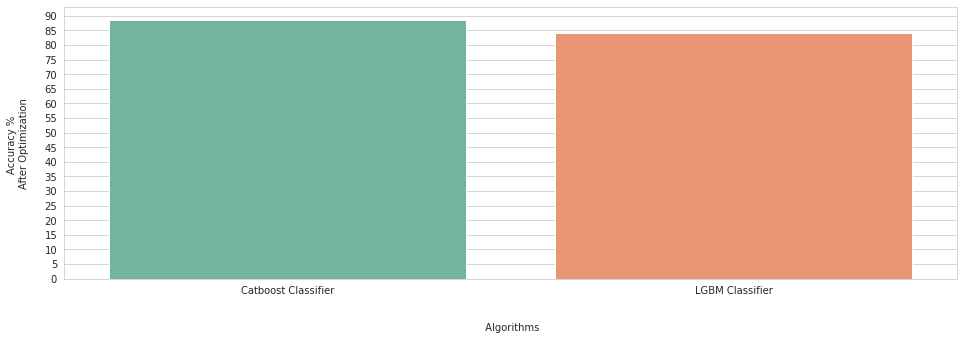

In [144]:
sb.set_style("whitegrid")
plt.figure(figsize=(16,5))
plt.yticks(np.arange(0,101,5))
plt.ylabel("Accuracy % \nAfter Optimization\n")
plt.xlabel("\n\n Algorithms")
sb.barplot(x=['Catboost Classifier','LGBM Classifier'], y=list(accuracies_df.iloc[0]), palette='Set2')
plt.savefig(FIGURES_PATH+"optimized_accuracies.png")
plt.show()

In [145]:
# roc auc after optimization
roc_auc_df

,cat,lgbm
0,88.636364,84.090909


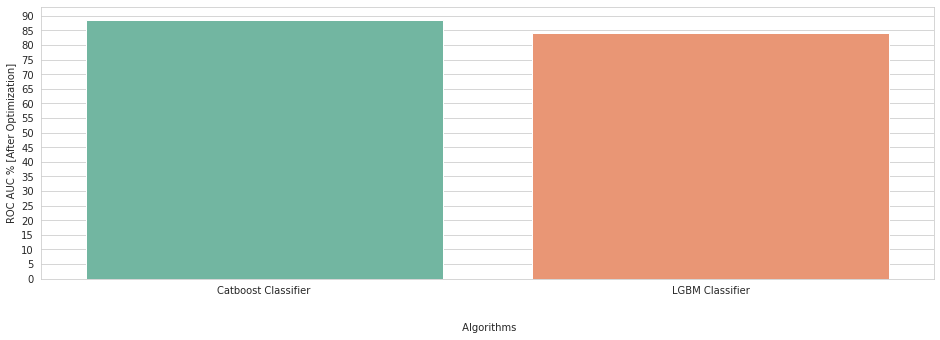

In [146]:
sb.set_style("whitegrid")
plt.figure(figsize=(16,5))
plt.yticks(np.arange(0,101,5))
plt.ylabel("ROC AUC % [After Optimization]")
plt.xlabel("\n\n Algorithms")
sb.barplot(x=['Catboost Classifier','LGBM Classifier'], y=list(accuracies_df.iloc[0]), palette='Set2')
plt.savefig(FIGURES_PATH+"optimized_roc_auc.png")
plt.show()

#### Best Model Selection

In [147]:
# Select the best optimized model
class BestModelSelection(TransformerMixin,BaseEstimator):
    def fit(self,X,y,roc_auc,model_names):
        return self
    def transform(self,X,y,roc_auc,model_names):
        best_model = None
        best_acc = 0
        best_model_name = None
        for model,acc,roc_auc,model_name in zip(X,y,roc_auc,model_names):
            if acc > best_acc:
                best_roc_auc = roc_auc
                best_acc = acc
                best_model = model
                best_model_name = model_name
        return best_model,best_acc,best_roc_auc,best_model_name

In [148]:
sel_best_model = BestModelSelection()
sel_best_model.fit(X=models,y=accuracies,roc_auc = roc_auc,model_names=names)
best_model,best_acc,best_roc_auc,best_model_name = sel_best_model.transform(X=models,y=accuracies,roc_auc = roc_auc,model_names=names)
results_df = pd.DataFrame(columns=['Best Model Name','Best Model Accuracy','Best ROC AUC'],data=[[best_model_name,best_acc,best_roc_auc]])
results_df

,Best Model Name,Best Model Accuracy,Best ROC AUC
0,cat,88.636364,88.636364


#### Model Evaluation

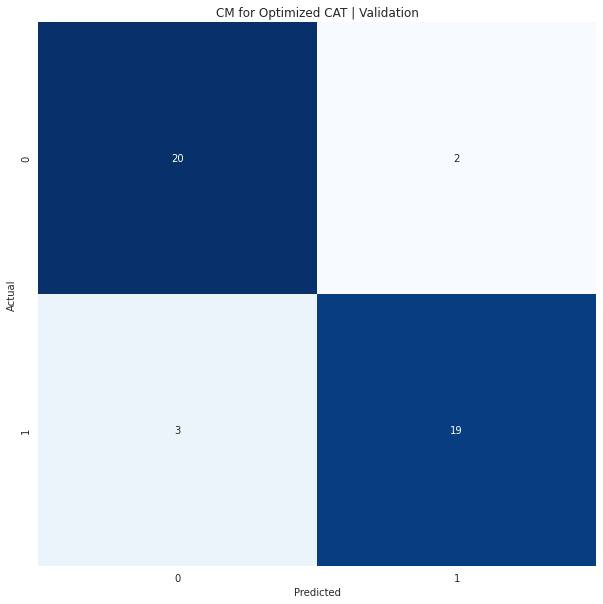

In [149]:
#Best model evaluation
y_pred = best_model.predict(X_valid)
#confusion matrix for the best model
sb.set_style("whitegrid")
plt.figure(figsize=(10,10))
conf_mat = confusion_matrix(y_valid, y_pred)
sb.heatmap(conf_mat, annot=True,cmap="Blues",cbar=False,annot_kws={"size":10},fmt="d")
plt.savefig(FIGURES_PATH+"Optimized_"+best_model_name+".png")
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title("CM for Optimized " + str(best_model_name).upper()+" | Validation")
plt.show()

In [150]:
print(classification_report(y_valid, y_pred))
print("Accuracy Score | Validation  : {:.2f}".format(accuracy_score(y_valid,y_pred)))

              precision    recall  f1-score   support

           0       0.87      0.91      0.89        22
           1       0.90      0.86      0.88        22

    accuracy                           0.89        44
   macro avg       0.89      0.89      0.89        44
weighted avg       0.89      0.89      0.89        44

Accuracy Score | Validation  : 0.89


In [151]:
model_optim = joblib.load(MODELS_PATH+'lgbm_optim.joblib')

In [152]:
test_set_predictions_optim = model_optim.predict_proba(X_test)

In [153]:
predicted_values_optim= pd.DataFrame(data=test_set_predictions_optim,columns=['Purchase','Not Purchase'])

In [154]:
predicted_values_optim.head(10)

,Purchase,Not Purchase
0,0.337600,0.662400
1,0.987679,0.012321
2,0.868836,0.131164
3,0.012031,0.987969
4,0.017466,0.982534
5,0.995679,0.004321
6,0.550308,0.449692
7,0.902870,0.097130
8,0.011120,0.988880
9,0.739097,0.260903


In [155]:
y_pred = []
for i in test_set_predictions_optim:
    y_pred.append(np.where(i == np.amax(i)))
y_pred = np.array(y_pred).flatten()

In [156]:
comparison_df = pd.DataFrame(y_test)
comparison_df['Predictions'] = y_pred

In [157]:
comparison_df.rename(columns={'next_purchase_day_range':'True Label', 'Predictions':'Predicted Label'}, inplace=True)

In [158]:
comparison_df.head(10)

,True Label,Predicted Label
40,1,1
87,0,0
90,0,0
50,1,1
35,0,1
119,0,0
104,0,0
5,1,0
2,1,1
108,0,0
